# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import tensorflow as tf

%matplotlib inline

In [2]:
dataset = get_dataset("/home/workspace/data/train/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/home/workspace/data/train/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 86
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


In [5]:
type(dataset)

tensorflow.python.data.ops.dataset_ops.DatasetV1Adapter

In [16]:
iterator = dataset.shuffle(10)

In [2]:
#this section is for testing

count=0
for item in iterator:
    if count == 3:
        break
    print(item.keys())
    fig, ax = plt.subplots()
    image = item["image"]
    height = image.shape[0]
    width = image.shape[1]
    ax.imshow(image)
    
    classes = item["groundtruth_classes"]
    class_color = {1: "r", 2: "b"}
    
    gt_bboxes = item["groundtruth_boxes"]
    for bbox, cls in zip(gt_bboxes, classes):
        y_min, x_min, y_max, x_max = bbox
        y_min *= width
        x_min *= height
        y_max *= width
        x_max *= height
        
        xy = (x_min, y_min)
        box_width = x_max - x_min
        box_height = y_max - y_min
        box = patches.Rectangle(xy, box_width, box_height, fill=False, ec=class_color[cls.numpy()])
        ax.add_patch(box)
    print(image.shape)
    plt.show()
    count += 1
    

NameError: name 'iterator' is not defined

## Write a function to display an image and the bounding boxes

Implement the `display_images` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_images(batch):
    # TODO - Your implementation here
    count=0
    for item in batch:
        if count==100:
            break
        fig, ax = plt.subplots()
        
        image = item["image"]
        height = image.shape[0]
        width = image.shape[1]
        ax.imshow(image)

        classes = item["groundtruth_classes"]
        class_color = {1:"r", 2:"b", 3:"g", 4:"y"}

        gt_bboxes = item["groundtruth_boxes"]
        for bbox, cls in zip(gt_bboxes, classes):
            y_min, x_min, y_max, x_max = bbox
            y_min *= width
            x_min *= height
            y_max *= width
            x_max *= height

            xy = (x_min, y_min)
            box_width = x_max - x_min
            box_height = y_max - y_min
            box = patches.Rectangle(xy, box_width, box_height, fill=False, ec=class_color[cls.numpy()])
            ax.add_patch(box)
        plt.show()
        count+=1

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

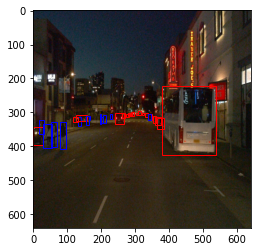

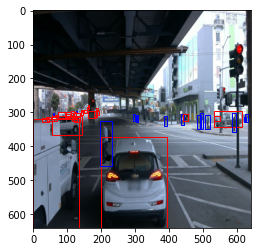

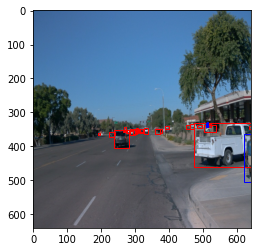

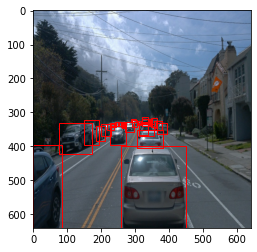

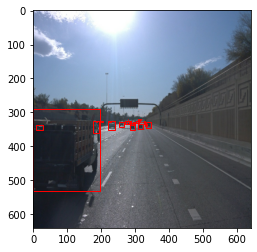

...

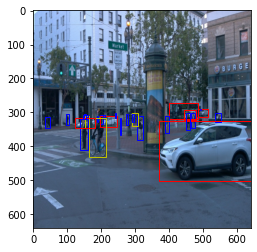

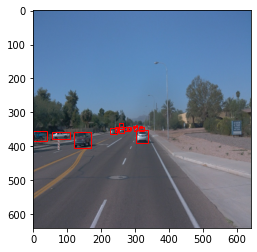

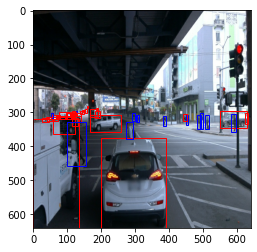

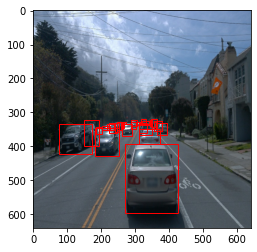

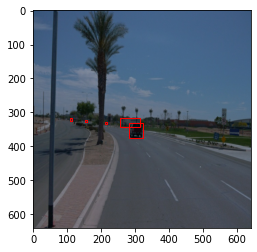

In [11]:
# Display 10 random images in dataset
batch = dataset.take(100)
display_images(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

## Class Distribution

First, creating the class distribution diagram to check class imbalances.
Below is the code making class distribution by 20000 random sampling from the dataset.

In [4]:
batch = dataset.as_numpy_iterator()
count = 0
class_counts = {}
for item in batch:
    if count==20000:
        break
    #print(item['groundtruth_classes'].numpy())
    classes = item['groundtruth_classes']
    for cls in classes:
        if cls not in class_counts:
            class_counts[cls] = 1
        else:
            class_counts[cls] += 1
    count += 1
print(class_counts)


{1: 346682, 2: 97773, 4: 2502}


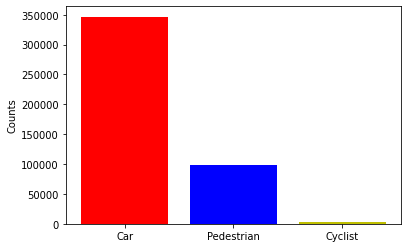

In [5]:
class_names = {1:"Car", 2:"Pedestrian", 4:"Cyclist"}
class_color = {1:"r", 2:"b", 4:"y"}
for key in class_counts.keys():
    plt.bar(class_names[key], class_counts[key], color=class_color[key])
plt.ylabel("Counts")
plt.show()

- From the above diagram, we can see that the bounding box labels are mostly labeled as Car, and followed by Pedestrian labels.
- And there are very few bounding boxes labeled as Cyclist.
- The class imbalance may affect the training of the model. For example, since the number of images containing cyclist is considered very small, it will be difficult to recognize cyclists correctly.

## Bounding box aspect ratios Distribution

Aspect ratios distribution may affect configuring the anchor box parameter of the model. 
Below is the code making aspect ratios distribution of the image.

In [7]:
batch = dataset.as_numpy_iterator()
count = 0
class_ars = {1: [], 2:[], 4:[]}
for item in batch:
    if count==20000:
        break
        
    image = item["image"]
    height = image.shape[0]
    width = image.shape[1]
    
    classes = item["groundtruth_classes"]
    gt_bboxes = item["groundtruth_boxes"]
    for bbox, cls in zip(gt_bboxes, classes):
        y_min, x_min, y_max, x_max = bbox
        y_min *= width
        x_min *= height
        y_max *= width
        x_max *= height
        
        box_width = x_max - x_min
        box_height = y_max - y_min
        
        
        
        aspect_ratio = box_width / box_height
        class_ars[cls].append(aspect_ratio)
    count += 1

### Aspect ratios distribution for all classes

In [8]:
all_class_ars = []
for value in class_ars.values():
    all_class_ars.extend(value)

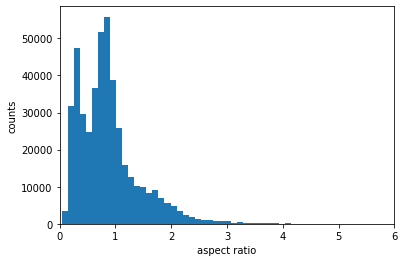

In [9]:
plt.hist(all_class_ars, bins=100)
plt.xlabel("aspect ratio")
plt.ylabel("counts")
plt.xlim([0, 6])
plt.show()

- We can see that most of the aspect ratios of the bounding boxes are in between 0-2.

### Class-wise aspect-ratios distribution

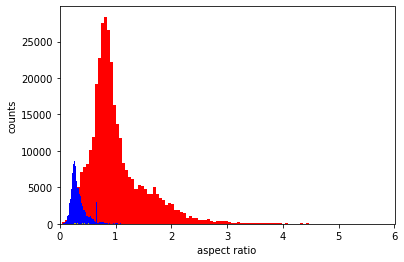

In [10]:
class_names = {1:"Car", 2:"Pedestrian", 4:"Cyclist"}
class_color = {1:"r", 2:"b", 4:"y"}
for key, value in class_ars.items():
    plt.hist(value, color=class_color[key], bins=200)
plt.xlabel("aspect ratio")
plt.ylabel("counts")
plt.xlim([0, 6])
plt.show()

Red: Car, Blue: Pedestrian, Yellow: Cyclist

- We can see the difference in distribution and it seems that the aspect ratios of Cars are slightly larger than that of Pedestrian.
- This is probably because the shape of Car is landscape, and that of Pedestrian is portrait.

## Bounding box sizes Distribution

The size of the bounding boxes may also affect configuring the anchor box parameter of the model. Also, class-wise distribution will be informative to analyze the data and configure the model.
Below is the code making box sizes Distribution of the bounding boxes.

In [ ]:
batch = dataset.as_numpy_iterator()
count = 0
class_sizes = {1: [], 2:[], 4:[]}
for item in batch:
    if count==20000:
        break
        
    image = item["image"]
    height = image.shape[0]
    width = image.shape[1]
    
    classes = item["groundtruth_classes"]
    gt_bboxes = item["groundtruth_boxes"]
    for bbox, cls in zip(gt_bboxes, classes):
        y_min, x_min, y_max, x_max = bbox
        y_min *= width
        x_min *= height
        y_max *= width
        x_max *= height
        
        box_width = x_max - x_min
        box_height = y_max - y_min
        
        
        box_size = box_width*box_height
        
        class_sizes[cls].append(box_size)
    count += 1

### Box sizes distribution of all classes

In [31]:
all_class_sizes = []
for value in class_sizes.values():
    all_class_sizes.extend(value)

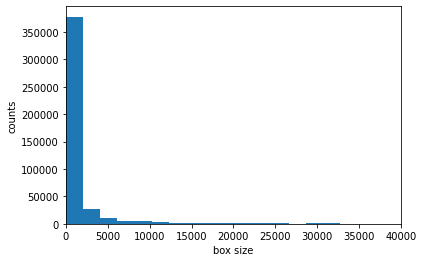

In [35]:
plt.hist(all_class_sizes, bins=200)
plt.xlabel("box size")
plt.ylabel("counts")
plt.xlim([0, 40000])
plt.show()

- We can see the most of the sizes are < 10000

### Class-wise Box sizes distribution

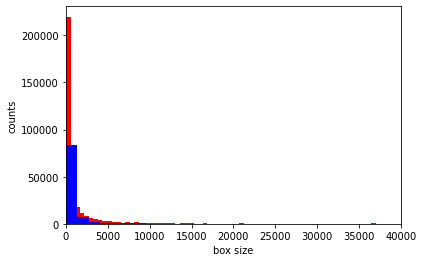

In [12]:
class_names = {1:"Car", 2:"Pedestrian", 4:"Cyclist"}
class_color = {1:"r", 2:"b", 4:"y"}
for key, value in class_sizes.items():
    plt.hist(value, color=class_color[key], bins=00)
plt.xlabel("box size")
plt.ylabel("counts")
plt.xlim([0, 40000])
plt.show()

Red: Car, Blue: Pedestrian, Yellow: Cyclist

- It seems that there is no significant difference in between the classes.